In [12]:
#pip install photutils
#pip install astroquery

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display
from datetime import datetime

from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import vstack, Table, Column
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_magnitudes, determine_fwhm
from phot_used_functions import import_images
from plotting import show_image

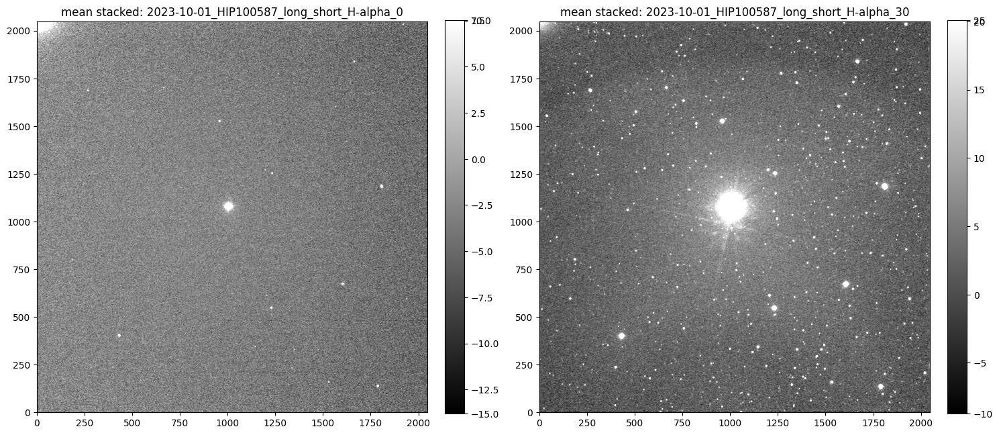

In [38]:
## from phot_used_functions import import_images
path_short        ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP100587_long_short_H-alpha_0.6s_10_images_stacked_'
path_long         ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP100587_long_short_H-alpha_30.0s_10_images_stacked_'
path_short_median ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked_old/lightCor_HIP100587_long_short_H-alpha_0.6s_10_images_stacked_ls_'
path_long_median  ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked_old/lightCor_HIP100587_long_short_H-alpha_30.0s_10_images_stacked_ls_'
     
image_list_long, header_list_long, titles_long, exptime_long = import_images(path_long)
image_list_short, header_list_short, titles_short, exptime_short = import_images(path_short)
image_list_long_median, header_list_long_median, titles_long_median, exptime_long_median = import_images(path_long_median)
image_list_short_median, header_list_short_median, titles_short_median, exptime_short_median = import_images(path_short_median)

middle = len(image_list_short)//2
image_short = image_list_short_median[middle]
image_long = image_list_long_median[middle]

w_short = WCS(header_list_short[middle]) #use mean images wcs because i didnt solved for median yet
w_long = WCS(header_list_long[middle])


fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_short, fig=fig, ax=ax[0])
show_image(image_long , fig=fig, ax=ax[1])
ax[0].set_title(f'mean stacked: {titles_short[middle]}')
ax[1].set_title(f'mean stacked: {titles_long[middle]}')
plt.tight_layout()

In [39]:
time_list =[]
for i in range (len(header_list_long)):
    print(header_list_long[i]['DATE-OBS'])
    time_list.append(header_list_long[i]['DATE-OBS'])

output_path = path_short[:46] + 'results'
if not os.path.exists(output_path):
    os.makedirs(output_path)

file_name = 'time_list' + '.txt'
file_path = os.path.join(output_path, file_name) 
with open(file_path, 'w') as file:
    for item in time_list:
        file.write(f"{item}\n")

2023-10-01T21:59:20
2023-10-01T22:06:56
2023-10-01T22:12:16


[-15.113430276862987, -15.120331444228775, -15.110029415177532]
0.004285943093245578
[array([[ 994.57481578, 1076.96190985]]), array([[1003.84066817, 1077.34369208]]), array([[1005.65018136, 1077.11025886]])]
[-15.128218202118989, -15.13031267845755, -15.1263909922923]
0.0016022605302871316
[array([[ 994.59227125, 1076.9483078 ]]), array([[1003.8331342 , 1077.33968289]]), array([[1005.69478894, 1077.10410424]])]


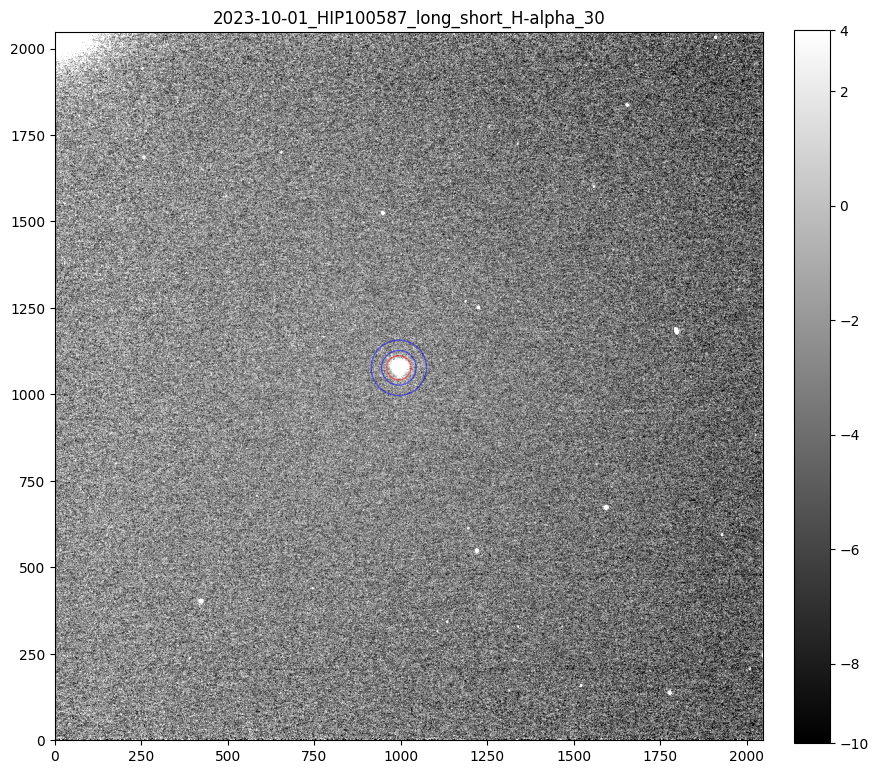

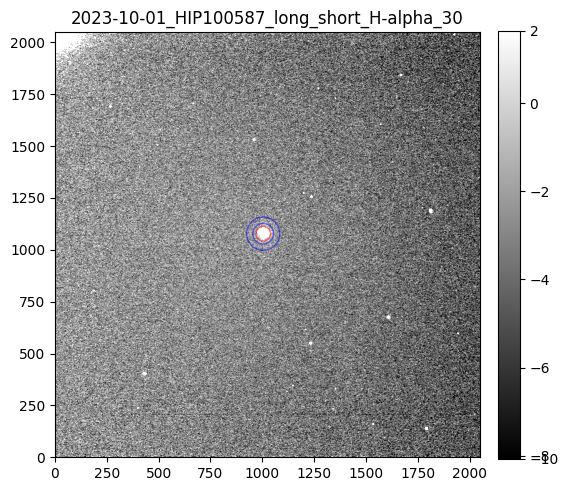

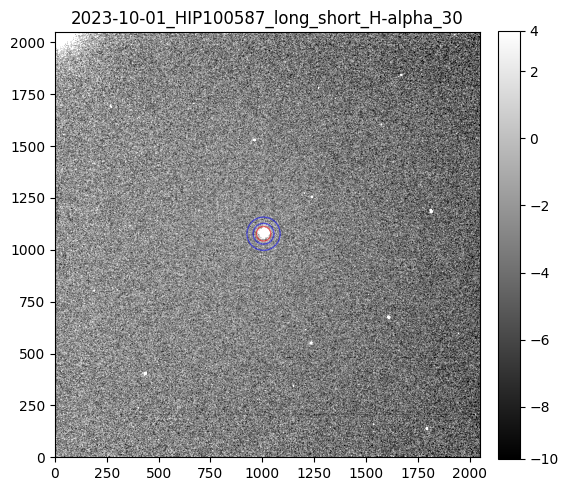

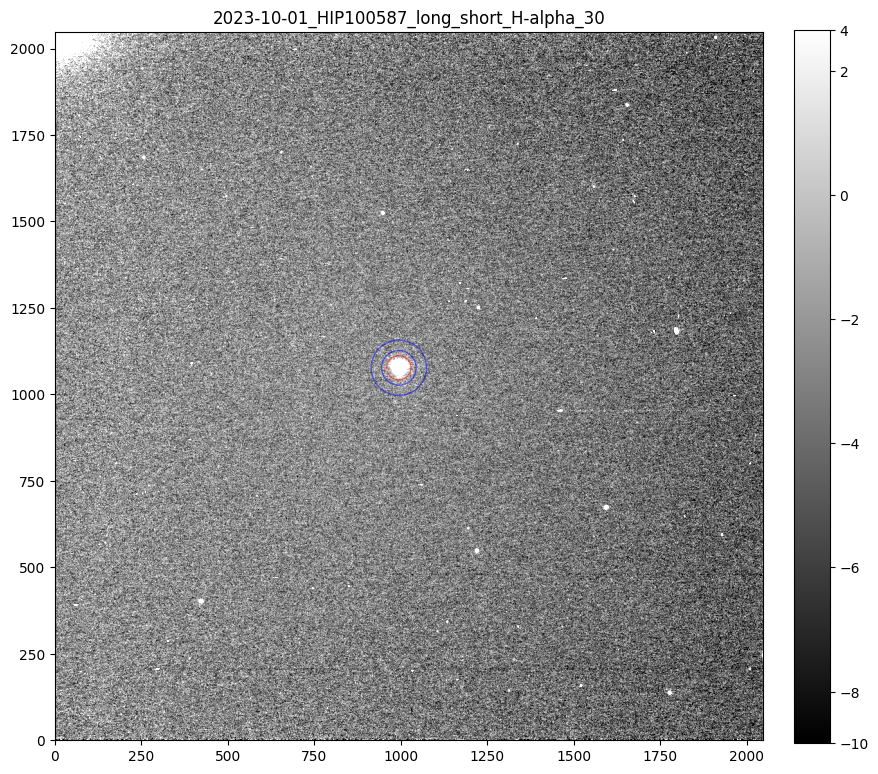

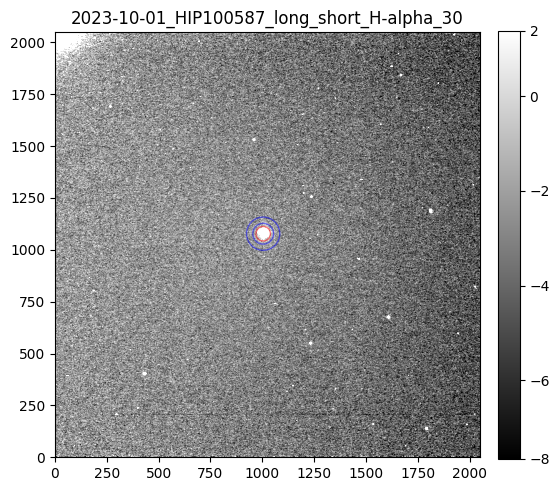

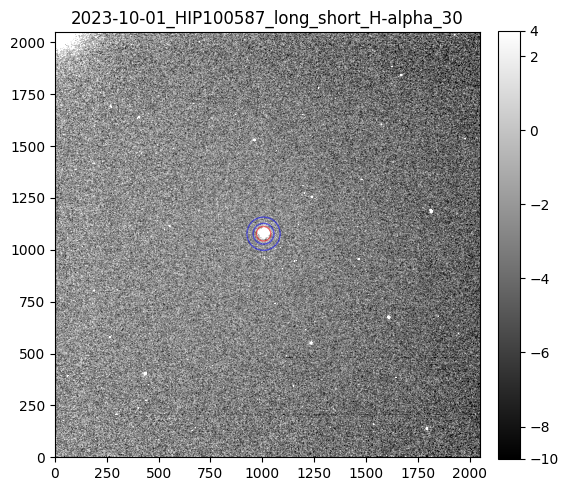

In [40]:
radius_bright = 35 ############## change here 
def get_mag_bright(image_list, apperture_radius=60): #default value of the apperture radius is 60 but need to be changed below
    positions_bright, magnitude_list_bright = [], []

    for i, image in enumerate(image_list):
        mean, median, std = sigma_clipped_stats(image, sigma=3.0)
        daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
        sources = daofind(image)
        positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
        if i == 0:
            fig, ax = plt.subplots(1,1, figsize=(10,10))
        else: 
            fig, ax = plt.subplots(1,1, figsize=(6,6))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles_long[i])
        magnitudes = determine_magnitudes(image, positions=positions, star_radius=apperture_radius, exptime=exptime_short)
        magnitude_list_bright.append(magnitudes)
        positions_bright.append(positions)
    print(magnitude_list_bright)
    print(np.std(magnitude_list_bright))
    print(positions_bright)
    return positions_bright, magnitude_list_bright

pos_br_median, mag_br_median = get_mag_bright(image_list_short_median, apperture_radius=radius_bright)
pos_br_mean, mag_br_mean = get_mag_bright(image_list_short, apperture_radius=radius_bright)

In [41]:
#should be the same theoretically 
print(pos_br_mean)
print(pos_br_median)

[array([[ 994.59227125, 1076.9483078 ]]), array([[1003.8331342 , 1077.33968289]]), array([[1005.69478894, 1077.10410424]])]
[array([[ 994.57481578, 1076.96190985]]), array([[1003.84066817, 1077.34369208]]), array([[1005.65018136, 1077.11025886]])]


In [42]:
# determine the shifts between images (other version at bottom of document)
shifts_long = determine_shift(image_list_long_median)
print(shifts_long)

#should be comperable
#shifts_short = determine_shift(image_list_short_median)
#print(shifts_short)

Number of images to process: 3
we use image:  1 from given list as reference image


[(-11.418406, -0.0434189), (0, 0), (1.2118733, 0.026944712)]


186
186
186
[-5.010443566165588, -5.0049017965661, -5.002513570856804]
0.003321640456991136
186
186
186
[-5.009754935614251, -5.006258727776131, -5.004831395356815]
0.0020683325476537557


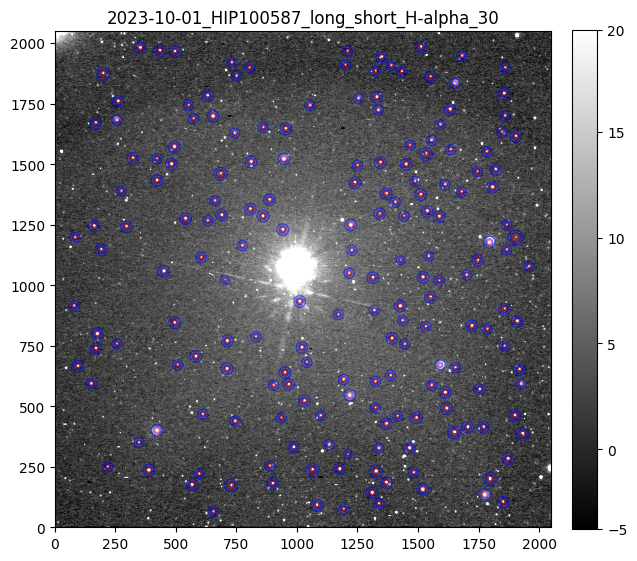

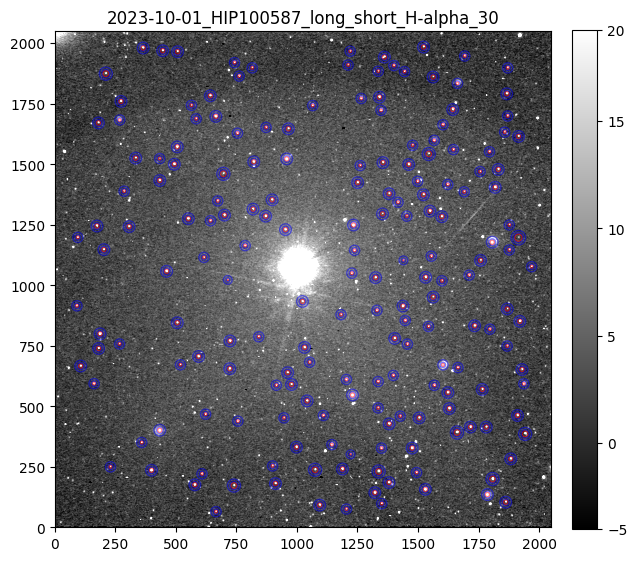

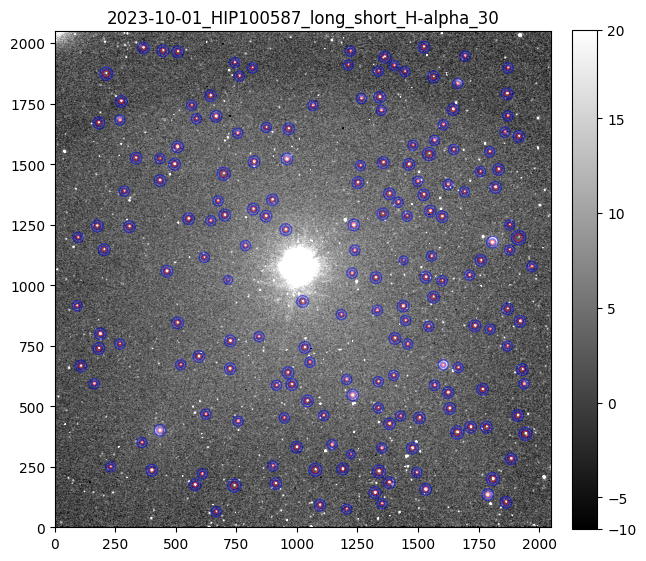

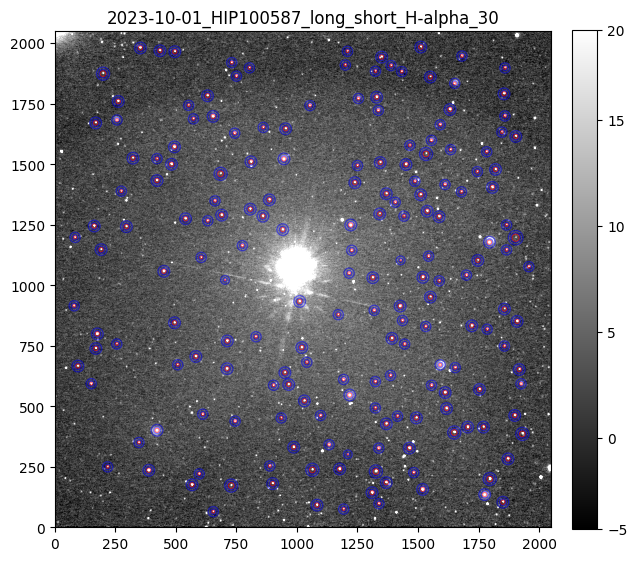

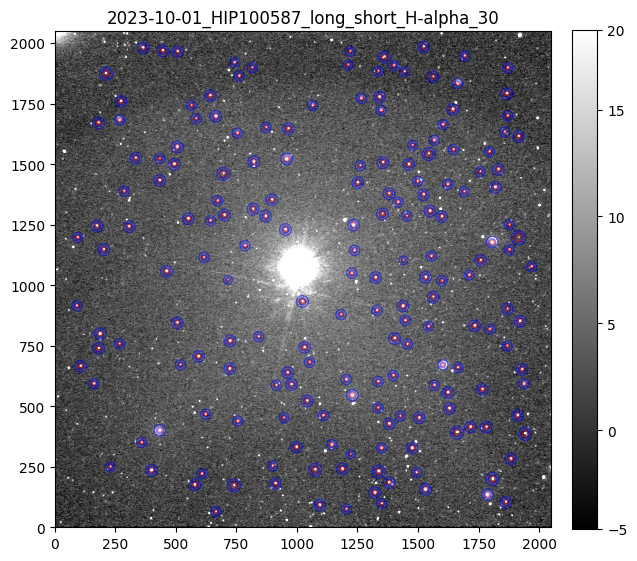

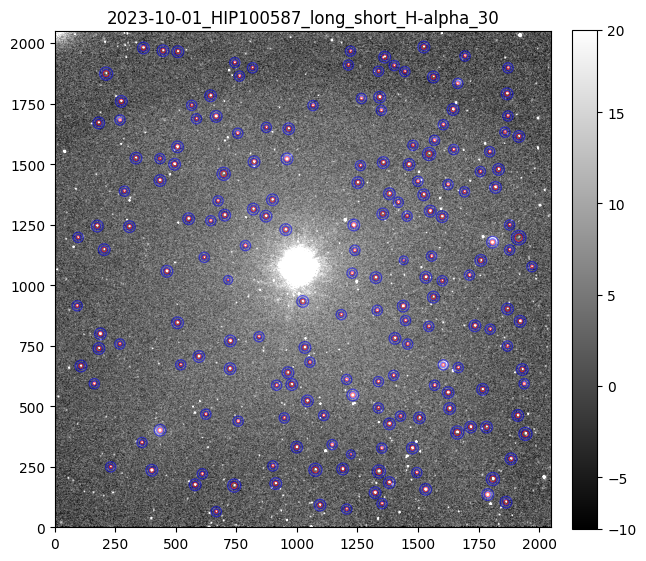

In [43]:
def get_mag_faint(image_list, threshold_value = 3):
    magnitude_list_faint, positions_faint = [], []

    mask = np.zeros(image_long.shape, dtype=bool)
    x, y = np.ogrid[:image_long.shape[1], :image_long.shape[0]]
    circle_mask = np.sqrt((x - pos_br_median[middle][0][1]) ** 2 + (y - pos_br_median[middle][0][0]) ** 2) <= (radius_bright+100)
    mask[circle_mask] = True

    mean, median, std = sigma_clipped_stats(image_long, sigma=3.0)
    daofind = DAOStarFinder(fwhm=3.0, threshold=threshold_value*std, roundlo=-5.0, roundhi=5.0) #roundlo and roundhi to adjust detection shape. need to be calibrated
    sources = daofind(image_long, mask=mask) #use image_long =middle image form median stacked
    sources.sort(['xcentroid', 'ycentroid'])
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    # Exclude multiple detections and stars which are to close to edge or each other (keep the brightest star)
    positions,sources = filter_sources(positions, sources, min_edge_distance=60)
    #determine individual radii for apertures
    valid_positions, fwhm = determine_fwhm(image_long, positions,max_value=8) ######################change max value later
    radii = [value * 3 for value in fwhm]  # aperture size should be 3 * FWHM
    
    for i,image in enumerate (image_list):
        shifted_positions = []
        for position in valid_positions:
            tuple = np.array((position[0]+shifts_long[i][0], position[1]+shifts_long[i][1]))
            #tuple = np.array((position[0]+shifts_alternative[i][0][0], position[1]+shifts_alternative[i][0][1]))
            shifted_positions.append(tuple)
        print(len(shifted_positions))

        fig, ax = plt.subplots(1,1, figsize = (7,7))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles_long[i])
        apertures_faint = [CircularAperture(position, r=r) for position, r in zip(shifted_positions, radii)]
        annulus_apertures_faint = [CircularAnnulus(position,r_in=radius+5, r_out=radius+15) for position,radius in zip(shifted_positions,radii)]
        for aperture in apertures_faint:
            aperture.plot(color="red", lw=1.0, alpha=0.5)
        for anulus in annulus_apertures_faint:
            anulus.plot(color="blue", lw=1.0, alpha=0.5)

        # Initialize an empty table to store the photometry results
        phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for j in range(len(apertures_faint)):
            aperstats = ApertureStats(image, annulus_apertures_faint[j])
            bkg = aperstats.median
            aperture_area = apertures_faint[j].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_faint[j])
            phot_table['total_bkg'] = total_bkg
            phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
        magnitudes=[]
        for row in phot_table_faint:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime_long))
            magnitudes.append(magnitude)
        magnitude_list_faint.append(magnitudes)
        positions_faint.append(shifted_positions)


    mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #mean of all refernce stars
    print(mean_faint_magnitudes_list)
    print(np.std(mean_faint_magnitudes_list))
    return positions_faint, magnitude_list_faint, mean_faint_magnitudes_list

pos_ft_mean,    mag_ft_mean,    mean_mag_ft_mean    = get_mag_faint(image_list_long, threshold_value=5.0)
pos_ft_median,  mag_ft_median,  mean_mag_ft_median  = get_mag_faint(image_list_long_median, threshold_value=5.0)



In [44]:
def print_results(magnitude_list_bright,mean_faint_magnitudes_list):
  diff_magnitude_list = []
  print("index  bright mag        faint mag         diff mag")
  for index in range (len(image_list_short)):
    diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
    print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
    diff_magnitude_list.append(diff_magnitude)
  print("The differential  Magnitude is: M = ", round(np.mean(diff_magnitude_list),4),"+-",round(np.std(diff_magnitude_list),4),"mag")
  print(f"Value for bright star: {round(np.mean(magnitude_list_bright),4)}+-{round(np.std(magnitude_list_bright),4)}")
  print(f"Value for faint stars: {round(np.mean(mean_faint_magnitudes_list),4)}+-{round(np.std(mean_faint_magnitudes_list),4)}")
  
print('for median:')
print_results(mag_br_median,  mean_mag_ft_median)
print('')
print('for mean:')
print_results(mag_br_mean,  mean_mag_ft_mean)

for median:
index  bright mag        faint mag         diff mag
0 -15.113430276862987 -5.009754935614251 -10.103675341248735
1 -15.120331444228775 -5.006258727776131 -10.114072716452643
2 -15.110029415177532 -5.004831395356815 -10.105198019820717
The differential  Magnitude is: M =  -10.1076 +- 0.0046 mag
Value for bright star: -15.1146+-0.0043
Value for faint stars: -5.0069+-0.0021

for mean:
index  bright mag        faint mag         diff mag
0 -15.128218202118989 -5.010443566165588 -10.1177746359534
1 -15.13031267845755 -5.0049017965661 -10.125410881891451
2 -15.1263909922923 -5.002513570856804 -10.123877421435497
The differential  Magnitude is: M =  -10.1224 +- 0.0033 mag
Value for bright star: -15.1283+-0.0016
Value for faint stars: -5.006+-0.0033


In [45]:
# for bright position
# no need to do it seperatly for mean and median, because positions are same (and only wcs information for mean)
bright_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

sky = w_short.pixel_to_world(*pos_br_mean[middle][0]) # for only long image
star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia: Gmag: phot_g_mean_mag, Plx: parallax [mas], G-RP: Gmag-Rmag
result = viz.query_region(star_coords, radius=3 * u.arcsecond, catalog='I/355 ') #gaia dr3

# Check and select the entry with the lowest magnitude
if result is not None and len(result) > 0:
    min_mag_idx = None
    min_mag = float('inf')

    # Find the entry with the lowest magnitude
    for idx, row in enumerate(result[0]):
        if row['BPmag'] < min_mag:
            min_mag = row['BPmag']
            min_mag_idx = idx
        if row['RPmag'] < min_mag:
            min_mag = row['RPmag']
            min_mag_idx = idx

    # If a minimum magnitude entry is found, update the values
    if min_mag_idx is not None:
        # Use .copy() to avoid modifying the original columns
        result[0]['Position Number'] = empty_column.copy()
        result[0]['x'] = x_column.copy()
        result[0]['y'] = y_column.copy()
        # Update the values for the current iteration
        result[0]['Position Number'][min_mag_idx] = len(pos_ft_mean[0])+1 #give it the last number, because we will combine with faint list
        result[0]['x'][min_mag_idx] = pos_br_mean[middle][0][0]
        result[0]['y'][min_mag_idx] = pos_br_mean[middle][0][1]

        bright_results.append(result[0][min_mag_idx])

print(bright_results)

[<Row index=0>
          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                  y         
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                         
           str28                 float64         float64      float64   float64   float64   float64   float64   float64  float32  float64   float64       object           object             object      
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ------------------ ------------------
Gaia DR3 1862193748217511040 305.96505748925  32.19013378977  4.689272  0.003562  3.181613  0.004281  3.972560   12.2359  0.1273  0.790946  1.507659             187 1003.833

In [46]:
# for faint position 
# here no need to it seperatly too
all_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

for i, position in enumerate(pos_ft_mean[middle]):
    sky = w_long.pixel_to_world(*position)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

    viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia
    result = viz.query_region(star_coords, radius= 2.0 * u.arcsecond, catalog='I/355 ') #gaia dr3

    # Check and select the entry with the lowest magnitude
    if result is not None and len(result) > 0:
        min_mag_idx = None
        min_mag = float('inf')

        # Find the entry with the lowest magnitude
        for idx, row in enumerate(result[0]):
            if row['BPmag'] < min_mag:
                min_mag = row['BPmag']
                min_mag_idx = idx
            if row['RPmag'] < min_mag:
                min_mag = row['RPmag']
                min_mag_idx = idx

        # If a minimum magnitude entry is found, update the values
        if min_mag_idx is not None:
            # Use .copy() to avoid modifying the original columns
            result[0]['Position Number'] = empty_column.copy()
            result[0]['x'] = x_column.copy()
            result[0]['y'] = y_column.copy()
            # Update the values for the current iteration
            result[0]['Position Number'][min_mag_idx] = i + 1
            result[0]['x'][min_mag_idx] = position[0]
            result[0]['y'][min_mag_idx] = position[1]

            all_results.append(result[0][min_mag_idx])

print(len(all_results))

186


In [47]:
final_table_gaia = vstack(all_results + bright_results)
final_table_gaia.pprint(max_lines=-1, max_width=-1)

          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                  y         
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                         
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ------------------ ------------------
Gaia DR3 2054252728498404096 305.76706095174  32.16078245411 14.495131  0.004409 13.491587  0.004713 14.225475    1.4434  0.0184  0.733889  1.003544               1  91.21265218648286  914.6620123965387
Gaia DR3 2054349622959821056 305.76790663531  32.21257510985 15.843506  0.003461 12.271808  0.003858 13.625169    0.3400  0.0224  1.353361  3.571698               2  94.91724176727277 1197

In [48]:
df = final_table_gaia.to_pandas()
display(df)

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,G-RP,BP-RP,Position Number,x,y
0,Gaia DR3 2054252728498404096,305.767061,32.160782,14.495131,0.004409,13.491587,0.004713,14.225475,1.4434,0.0184,0.733889,1.003544,1,91.212652,914.662012
1,Gaia DR3 2054349622959821056,305.767907,32.212575,15.843506,0.003461,12.271808,0.003858,13.625169,0.3400,0.0224,1.353361,3.571698,2,94.917242,1197.344215
2,Gaia DR3 2054252316181517568,305.770362,32.114936,15.238069,0.003114,13.497399,0.003932,14.402431,0.7101,0.0178,0.905031,1.740669,3,106.578997,665.994306
3,Gaia DR3 2054252247462023936,305.782185,32.101443,13.180520,0.002840,12.426494,0.003793,12.884129,1.8408,0.0139,0.457635,0.754026,4,161.843052,593.234036
4,Gaia DR3 2054349726039034240,305.784957,32.221279,14.179742,0.002862,13.276758,0.003815,13.811892,1.6260,0.0133,0.535133,0.902984,5,173.905048,1244.249703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,Gaia DR3 1862188903491616128,306.165463,32.111417,15.312012,0.003101,13.123076,0.003827,14.211083,0.2398,0.1191,1.088008,2.188936,183,1929.565565,651.433537
183,Gaia DR3 1862188834771795968,306.166984,32.100588,12.962796,0.002964,10.502938,0.003799,11.624550,0.5432,0.0166,1.121612,2.459858,184,1937.04557,592.576578
184,Gaia DR3 1862188422454917376,306.167922,32.062687,15.078763,0.003041,12.536640,0.003816,13.682134,0.2733,0.0131,1.145493,2.542123,185,1942.328232,385.754402
185,Gaia DR3 1862195981597752320,306.174554,32.189405,14.410340,0.003219,13.501887,0.004253,14.046431,0.5999,0.0144,0.544543,0.908453,186,1969.23759,1076.336163


In [49]:
valid_positions = df['Position Number'].to_list()
print(valid_positions)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [50]:
#combine the faint and bright magnitudes (for saving them into table later)
mag_all_mean    = [ft + [br] for ft, br in zip(mag_ft_mean, mag_br_mean)]
mag_all_median  = [ft + [br] for ft, br in zip(mag_ft_median, mag_br_median)]

print(mag_all_mean[0][-1])
print(len(mag_all_mean[0]))

-15.128218202118989
187


In [51]:
#only save the magnitudes from the positions which are solved with gaia data
valid_mag_mean   = []
valid_mag_median = []
for i in range (len(mag_all_mean)):
    m1=[]
    m2=[]
    for index in valid_positions:
        m1.append(mag_all_mean[i][index-1])
        m2.append(mag_all_median[i][index-1])
    valid_mag_mean.append(m1)
    valid_mag_median.append(m2)

print(valid_positions)
print(mag_all_median)
print(valid_mag_median)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]
[[-4.570224253777982, -4.386180657880586, -4.506914828218718, -5.6764626371102285, -4.844682769410941, -4.340788379843955, -4.310426499632479, -6.388797266867256, -4.181075

In [52]:
for i, mag_list in enumerate(valid_mag_mean):
    col_name = f'Mag_Mean_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list})  # Add magnitudes for the current image to the DataFrame

for i, mag_list in enumerate(valid_mag_median):
    col_name = f'Mag_Median_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list}) 

display(df)

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,...,BP-RP,Position Number,x,y,Mag_Mean_Im_1,Mag_Mean_Im_2,Mag_Mean_Im_3,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3
0,Gaia DR3 2054252728498404096,305.767061,32.160782,14.495131,0.004409,13.491587,0.004713,14.225475,1.4434,0.0184,...,1.003544,1,91.212652,914.662012,-4.576775,-4.542454,-4.517551,-4.570224,-4.557990,-4.462340
1,Gaia DR3 2054349622959821056,305.767907,32.212575,15.843506,0.003461,12.271808,0.003858,13.625169,0.3400,0.0224,...,3.571698,2,94.917242,1197.344215,-4.346972,-4.474591,-4.406019,-4.386181,-4.508345,-4.441948
2,Gaia DR3 2054252316181517568,305.770362,32.114936,15.238069,0.003114,13.497399,0.003932,14.402431,0.7101,0.0178,...,1.740669,3,106.578997,665.994306,-4.492480,-4.421738,-4.555736,-4.506915,-4.404228,-4.476672
3,Gaia DR3 2054252247462023936,305.782185,32.101443,13.180520,0.002840,12.426494,0.003793,12.884129,1.8408,0.0139,...,0.754026,4,161.843052,593.234036,-5.670568,-5.659619,-5.648015,-5.676463,-5.665379,-5.660736
4,Gaia DR3 2054349726039034240,305.784957,32.221279,14.179742,0.002862,13.276758,0.003815,13.811892,1.6260,0.0133,...,0.902984,5,173.905048,1244.249703,-4.850045,-4.854164,-4.772554,-4.844683,-4.871824,-4.800874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,Gaia DR3 1862188903491616128,306.165463,32.111417,15.312012,0.003101,13.123076,0.003827,14.211083,0.2398,0.1191,...,2.188936,183,1929.565565,651.433537,-4.508418,-4.609025,-4.507685,-4.472683,-4.601996,-4.449399
183,Gaia DR3 1862188834771795968,306.166984,32.100588,12.962796,0.002964,10.502938,0.003799,11.624550,0.5432,0.0166,...,2.459858,184,1937.04557,592.576578,-6.912918,-6.921460,-6.923677,-6.909551,-6.920765,-6.922329
184,Gaia DR3 1862188422454917376,306.167922,32.062687,15.078763,0.003041,12.536640,0.003816,13.682134,0.2733,0.0131,...,2.542123,185,1942.328232,385.754402,-5.123795,-5.026962,-5.174412,-5.123409,-5.025093,-5.211357
185,Gaia DR3 1862195981597752320,306.174554,32.189405,14.410340,0.003219,13.501887,0.004253,14.046431,0.5999,0.0144,...,0.908453,186,1969.23759,1076.336163,-4.584863,-4.603164,-4.597305,-4.573107,-4.605769,-4.597189


In [53]:
#save to csv file
file_name = 'results_' + titles_long[0][:74]
file_path = os.path.join(output_path, file_name) #output path defined above
df.to_csv(file_path)

In [54]:
'''
all_coordinates = []
all_results = []

for i, pixel_coords in enumerate(positions):
    sky = w.pixel_to_world(*pixel_coords)

    # Create SkyCoord object for the star
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    all_coordinates.append(star_coords.to_string(style='hmsdms'))

    customSimbad = Simbad()
    customSimbad.add_votable_fields('flux(B)', 'flux(V)', 'flux(R)')
    result_table = customSimbad.query_region(star_coords, radius=3 * u.arcsecond)

    # Append the individual result to the list
    if result_table is not None:
        result_table['Position Number'] = i + 1
        all_results.append(result_table)

    #print(f"Star {i + 1}: {star_coords.to_string(style='hmsdms')}")

for i in range (len(all_coordinates)):
  print(f"star {i}: {all_coordinates[i]}")


# Merge all individual result tables into one
final_table_simbad = vstack(all_results)
# Reorder columns to make 'Number' the first column
cols = final_table_simbad.colnames
cols = ['Position Number'] + [col for col in cols if col != 'Position Number']
final_table_simbad = final_table_simbad[cols]

print("")
print("")
final_table_simbad.pprint(max_lines=-1, max_width=-1)
'''

'\nall_coordinates = []\nall_results = []\n\nfor i, pixel_coords in enumerate(positions):\n    sky = w.pixel_to_world(*pixel_coords)\n\n    # Create SkyCoord object for the star\n    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame=\'icrs\', unit=(u.deg, u.deg))\n    all_coordinates.append(star_coords.to_string(style=\'hmsdms\'))\n\n    customSimbad = Simbad()\n    customSimbad.add_votable_fields(\'flux(B)\', \'flux(V)\', \'flux(R)\')\n    result_table = customSimbad.query_region(star_coords, radius=3 * u.arcsecond)\n\n    # Append the individual result to the list\n    if result_table is not None:\n        result_table[\'Position Number\'] = i + 1\n        all_results.append(result_table)\n\n    #print(f"Star {i + 1}: {star_coords.to_string(style=\'hmsdms\')}")\n\nfor i in range (len(all_coordinates)):\n  print(f"star {i}: {all_coordinates[i]}")\n\n\n# Merge all individual result tables into one\nfinal_table_simbad = vstack(all_results)\n# Reorder columns to make \'Number\' the fi

# Compare Simbad with Gaia

In [55]:
'''
position_numbers_simbad = final_table_simbad[final_table_simbad.colnames[0]].data.tolist()
b_mag_simbad = final_table_simbad[final_table_simbad.colnames[12]].data.tolist()
pos_mag_simbad = [(pos,mag) for pos, mag in zip(position_numbers_simbad, b_mag_simbad)]
print(pos_mag_simbad)

position_numbers_gaia = final_table_gaia[final_table_gaia.colnames[5]].data.tolist()
b_mag_gaia = final_table_gaia[final_table_gaia.colnames[3]].data.tolist()
pos_mag_gaia = [(pos,mag) for pos, mag in zip(position_numbers_gaia, b_mag_gaia)]
print(pos_mag_gaia)
'''

'\nposition_numbers_simbad = final_table_simbad[final_table_simbad.colnames[0]].data.tolist()\nb_mag_simbad = final_table_simbad[final_table_simbad.colnames[12]].data.tolist()\npos_mag_simbad = [(pos,mag) for pos, mag in zip(position_numbers_simbad, b_mag_simbad)]\nprint(pos_mag_simbad)\n\nposition_numbers_gaia = final_table_gaia[final_table_gaia.colnames[5]].data.tolist()\nb_mag_gaia = final_table_gaia[final_table_gaia.colnames[3]].data.tolist()\npos_mag_gaia = [(pos,mag) for pos, mag in zip(position_numbers_gaia, b_mag_gaia)]\nprint(pos_mag_gaia)\n'

In [56]:
'''

diff_mag_simbad, diff_mag_gaia = [], []

for i in range (len(pos_mag_simbad)):
  n = pos_mag_simbad[i][0] #wanted position number
  for j in range (len(pos_mag_gaia)):
    if pos_mag_gaia[j][0] == n:
      reference_index = j
  if pos_mag_simbad[i][1] is not None:
      d1 = pos_mag_simbad[i][1] - pos_mag_simbad[6][1] # 6 is index for HIP10587 in simbad
      d2 = pos_mag_gaia[reference_index][1] - pos_mag_gaia[122][1] #122 is HIP100587 in gaia
      diff_mag_simbad.append(round(d1,2))
      diff_mag_gaia.append(round(d2,2))


print(len(diff_mag_simbad))
print(diff_mag_simbad)
print(diff_mag_gaia)
print(np.mean(diff_mag_simbad))
print(np.mean(diff_mag_gaia))
'''

'\n\ndiff_mag_simbad, diff_mag_gaia = [], []\n\nfor i in range (len(pos_mag_simbad)):\n  n = pos_mag_simbad[i][0] #wanted position number\n  for j in range (len(pos_mag_gaia)):\n    if pos_mag_gaia[j][0] == n:\n      reference_index = j\n  if pos_mag_simbad[i][1] is not None:\n      d1 = pos_mag_simbad[i][1] - pos_mag_simbad[6][1] # 6 is index for HIP10587 in simbad\n      d2 = pos_mag_gaia[reference_index][1] - pos_mag_gaia[122][1] #122 is HIP100587 in gaia\n      diff_mag_simbad.append(round(d1,2))\n      diff_mag_gaia.append(round(d2,2))\n\n\nprint(len(diff_mag_simbad))\nprint(diff_mag_simbad)\nprint(diff_mag_gaia)\nprint(np.mean(diff_mag_simbad))\nprint(np.mean(diff_mag_gaia))\n'

In [57]:
'''
all_coordinates = []

for i, pixel_coords in enumerate(positions):
    sky = w.pixel_to_world(*pixel_coords)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    all_coordinates.append(star_coords.to_string(style='hmsdms'))

split_coordinates = [coord.split(' ') for coord in all_coordinates]
RA = [split[0] for split in split_coordinates]
DEC = [split[1] for split in split_coordinates]

data = {
    'ID': [i+1 for i in range(len(positions))],
    'X': [pos[0] for pos in positions],
    'Y': [pos[1] for pos in positions],
    'ra': RA,
    'dec': DEC,
    'flux': aperture_sum_list
}

df = pd.DataFrame(data)
display(df)

# save data to csv
df.to_csv('/content/drive/MyDrive/Bachelor/data/Coordinates Files/positions_'+ target_name +'.csv', index=False)
'''

"\nall_coordinates = []\n\nfor i, pixel_coords in enumerate(positions):\n    sky = w.pixel_to_world(*pixel_coords)\n    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))\n    all_coordinates.append(star_coords.to_string(style='hmsdms'))\n\nsplit_coordinates = [coord.split(' ') for coord in all_coordinates]\nRA = [split[0] for split in split_coordinates]\nDEC = [split[1] for split in split_coordinates]\n\ndata = {\n    'ID': [i+1 for i in range(len(positions))],\n    'X': [pos[0] for pos in positions],\n    'Y': [pos[1] for pos in positions],\n    'ra': RA,\n    'dec': DEC,\n    'flux': aperture_sum_list\n}\n\ndf = pd.DataFrame(data)\ndisplay(df)\n\n# save data to csv\ndf.to_csv('/content/drive/MyDrive/Bachelor/data/Coordinates Files/positions_'+ target_name +'.csv', index=False)\n"

In [58]:
'''
#pip install astroalign
import astroalign as aa

def determine_shift_aa(imageList, referenceImage = None, wanted_index = None):
    print('Number of images to process:', len(imageList))
    shifts = []

    if referenceImage is None:
        if wanted_index is None:
          wanted_index = len(imageList)//2
        print('we use image: ',wanted_index,"from given list as reference image (keep in mind numbers star at 0)")
        reference_image = imageList[wanted_index].astype(np.float32)
    else:
        reference_image = referenceImage.astype(np.float32)

    for i, image in enumerate(imageList):
      if i == wanted_index:
        shifts.append((0,0)) #no shift for the reference image relativ to itself
      else:
        source = image.astype(np.float32)
        #registered_image, footprint = aa.register(source, reference_image) #target is reference image
        transf, (source_list, target_list) = aa.find_transform(source, reference_image)
        translation_params = transf.params  # Get parameters of the transformation
        shift_x = translation_params[0, 2]
        shift_y = translation_params[1,2]
        #shift_x, shift_y = warp_matrix[0, 2], warp_matrix[1, 2]
        shifts.append((shift_x, shift_y))
    return shifts

    #return shifts
shifts_long = determine_shift_aa(image_list_long)
print(shifts_long)
'''

'\n#pip install astroalign\nimport astroalign as aa\n\ndef determine_shift_aa(imageList, referenceImage = None, wanted_index = None):\n    print(\'Number of images to process:\', len(imageList))\n    shifts = []\n\n    if referenceImage is None:\n        if wanted_index is None:\n          wanted_index = len(imageList)//2\n        print(\'we use image: \',wanted_index,"from given list as reference image (keep in mind numbers star at 0)")\n        reference_image = imageList[wanted_index].astype(np.float32)\n    else:\n        reference_image = referenceImage.astype(np.float32)\n\n    for i, image in enumerate(imageList):\n      if i == wanted_index:\n        shifts.append((0,0)) #no shift for the reference image relativ to itself\n      else:\n        source = image.astype(np.float32)\n        #registered_image, footprint = aa.register(source, reference_image) #target is reference image\n        transf, (source_list, target_list) = aa.find_transform(source, reference_image)\n        tr